# Deep Learning with PyTorch Step-by-Step: A Beginner's Guide

# Chapter 2

* env: 
    * fyp2026 (Python 3.11.11) 
    * fpytorch (Python 3.11.11)
* packages:<br>
    %% Chapter00
    * numpy-1.26.4: python -c "import numpy; print(numpy.__ version__)"
    * scipy-1.15.1: python -c "import scipy; print(scipy.__ version__)"
    * scikit-learn-1.6.1<br>
    
    %% Chapter01
    * tensorboard-2.19.0 --> conda install -c conda-forge tensorboard
    * scikit-learn-1.6.1 --> conda install scikit-learn (or: pip install scikit-learn)
    * pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu126
    * torchviz-0.0.3 --> pip install torchviz
    * graphviz --> install from IT Service Port

    %% Chapter02
    * tensorboard-2.19.0

In [1]:
try:
    import google.colab
    import requests
    url = 'https://raw.githubusercontent.com/dvgodoy/PyTorchStepByStep/master/config.py'
    r = requests.get(url, allow_redirects=True)
    open('config.py', 'wb').write(r.content)    
except ModuleNotFoundError:
    pass

from config import *
config_chapter2()
# This is needed to render the plots in this chapter
from plots.chapter2 import *

In [2]:
import numpy as np
from sklearn.linear_model import LinearRegression

import torch
import torch.optim as optim
import torch.nn as nn
from torch.utils.data import Dataset, TensorDataset, DataLoader
from torch.utils.data.dataset import random_split
from torch.utils.tensorboard import SummaryWriter

import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')

In [3]:
print(np.__version__)
print(torch.__version__)

1.26.4
2.6.0+cu126


# Rethinking the Training Loop

### Model Training V0

In [3]:
# Runs data generation - so we do not need to copy code here
%run -i data_generation/simple_linear_regression.py

# Runs the first two parts of the sequence: data preparation and model configuration
%run -i data_preparation/v0.py
%run -i model_configuration/v0.py

In [4]:
# %load model_training/v0.py

# Defines number of epochs
n_epochs = 1000

for epoch in range(n_epochs):
    # Sets model to TRAIN mode
    model.train()

    # Step 1 - Computes our model's predicted output - forward pass
    # No more manual prediction!
    yhat = model(x_train_tensor)
    
    # Step 2 - Computes the loss
    loss = loss_fn(yhat, y_train_tensor)

    # Step 3 - Computes gradients for both "a" and "b" parameters
    loss.backward()
    
    # Step 4 - Updates parameters using gradients and the learning rate
    optimizer.step()
    optimizer.zero_grad()

In [5]:
print(model.state_dict())

OrderedDict([('0.weight', tensor([[1.9690]], device='cuda:0')), ('0.bias', tensor([1.0235], device='cuda:0'))])


## Higher-Order Functions - 高阶函数

In [8]:
def square(x):
    return x ** 2

def cube(x):
    return x ** 3

def fourth_power(x):
    return x ** 4

# and so on and so forth...

In [9]:
def generic_exponentiation(x, exponent):
    return x ** exponent

In [10]:
def skeleton_exponentiation(x):
    return x ** exponent

In [11]:
skeleton_exponentiation(2)

NameError: name 'exponent' is not defined

### Highered-Order Function - `exponentiation_builder()`

In [12]:
def exponentiation_builder(exponent):
    def skeleton_exponentiation(x):
        return x ** exponent

    return skeleton_exponentiation

In [70]:
returned_function = exponentiation_builder(3)

returned_function

<function __main__.exponentiation_builder.<locals>.skeleton_exponentiation(x)>

In [71]:
returned_function(5)

125

In [15]:
square = exponentiation_builder(2)
cube = exponentiation_builder(3)
fourth_power = exponentiation_builder(4)

# and so on and so forth...

### Helper Function #1 - 辅助函数

In [21]:
def make_train_step_fn(model, loss_fn, optimizer):
    # Builds function that performs a step in the train loop
    def perform_train_step_fn(x, y):
        # Sets model to TRAIN mode
        model.train()
        
        # Step 1 - Computes our model's predicted output - forward pass
        yhat = model(x)
        # Step 2 - Computes the loss
        loss = loss_fn(yhat, y)
        # Step 3 - Computes gradients for both "a" and "b" parameters
        loss.backward()
        # Step 4 - Updates parameters using gradients and the learning rate
        optimizer.step()
        optimizer.zero_grad()
        
        # Returns the loss
        return loss.item()
    
    # Returns the function that will be called inside the train loop
    return perform_train_step_fn

### Model Configuration V1

In [22]:
%run -i data_preparation/v0.py

In [23]:
%%writefile model_configuration/v1_1.py

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Sets learning rate - this is "eta" ~ the "n" like Greek letter
lr = 0.1

torch.manual_seed(42)
# Now we can create a model and send it at once to the device
model = nn.Sequential(nn.Linear(1, 1)).to(device)

# Defines a SGD optimizer to update the parameters (now retrieved directly from the model)
optimizer = optim.SGD(model.parameters(), lr=lr)

# Defines a MSE loss function
loss_fn = nn.MSELoss(reduction='mean')

# Creates the train_step function for our model, loss function and optimizer
train_step_fn = make_train_step_fn(model, loss_fn, optimizer)

Overwriting model_configuration/v1_1.py


In [24]:
%run -i model_configuration/v1.py

In [25]:
# higer-order function returns a function - perform_train_step_fn(x, y)
train_step_fn

<function __main__.make_train_step_fn.<locals>.perform_train_step_fn(x, y)>

### `%%writefile`

The `%%writefile` magic command in Jupyter Notebooks is used to write the contents of the cell to a file. When you use %%writefile at the beginning of a cell, it takes the rest of the cell's content and writes it to the specified file path.

you can use `%%writefile` to save code into a non-existent file. If the specified file does not exist, it will be created. If the file already exists, it will be overwritten.

### Model Training V1

In [26]:
%%writefile model_training/v1.py

# Defines number of epochs
n_epochs = 1000

losses = []

# For each epoch...
for epoch in range(n_epochs):
    # Performs one train step and returns the corresponding loss
    loss = train_step_fn(x_train_tensor, y_train_tensor)
    losses.append(loss)

    # when loss_next is bigger than loss_current, stop the training
    #if epoch > 0 and losses[epoch] > losses[epoch - 1]:
        #break

    # Prints the loss for every 100 epochs
    if epoch % 100 == 0:
        print(f'Epoch {epoch}/{n_epochs}, Loss: {loss}')

Overwriting model_training/v1.py


In [27]:
%run -i model_training/v1.py

Epoch 0/1000, Loss: 0.7255968451499939
Epoch 100/1000, Loss: 0.011530499905347824
Epoch 200/1000, Loss: 0.00821065902709961
Epoch 300/1000, Loss: 0.008052562363445759
Epoch 400/1000, Loss: 0.008045033551752567
Epoch 500/1000, Loss: 0.00804467499256134
Epoch 600/1000, Loss: 0.008044656366109848
Epoch 700/1000, Loss: 0.008044657297432423
Epoch 800/1000, Loss: 0.008044655434787273
Epoch 900/1000, Loss: 0.008044655434787273


In [28]:
# Checks model's parameters
print(model.state_dict())

OrderedDict([('0.weight', tensor([[1.9690]], device='cuda:0')), ('0.bias', tensor([1.0235], device='cuda:0'))])


# Dataset

### Cell 2.1

In [29]:
class CustomDataset(Dataset):
    def __init__(self, x_tensor, y_tensor):
        self.x = x_tensor
        self.y = y_tensor
        
    def __getitem__(self, index):
        return (self.x[index], self.y[index])

    def __len__(self):
        return len(self.x)

# Wait, is this a CPU tensor now? Why? Where is .to(device)?
x_train_tensor = torch.from_numpy(x_train).float()
y_train_tensor = torch.from_numpy(y_train).float()

train_data = CustomDataset(x_train_tensor, y_train_tensor)
print(train_data[0])

(tensor([0.7713]), tensor([2.4745]))


## TensorDataset

### Cell 2.2

In [30]:
train_data = TensorDataset(x_train_tensor, y_train_tensor)
print(train_data[0])

(tensor([0.7713]), tensor([2.4745]))


## DataLoader - iterator

### Cell 2.3

In [31]:
train_loader = DataLoader(dataset=train_data, batch_size=16, shuffle=True)

In [32]:
# DataLoader is an iterator
next(iter(train_loader))

[tensor([[0.2809],
         [0.3253],
         [0.1560],
         [0.5924],
         [0.0651],
         [0.8872],
         [0.4938],
         [0.0055],
         [0.1409],
         [0.0885],
         [0.1849],
         [0.7290],
         [0.8662],
         [0.3117],
         [0.6842],
         [0.1987]]),
 tensor([[1.5846],
         [1.8057],
         [1.2901],
         [2.1687],
         [1.1559],
         [2.8708],
         [1.9060],
         [1.0632],
         [1.1211],
         [1.0708],
         [1.5888],
         [2.4927],
         [2.6805],
         [1.7637],
         [2.3492],
         [1.2654]])]

### Data Preparation V1

In [33]:
%%writefile data_preparation/v1.py

# Our data was in Numpy arrays, but we need to transform them into PyTorch's Tensors
# Tensor is CPU tensor
x_train_tensor = torch.from_numpy(x_train).float()
y_train_tensor = torch.from_numpy(y_train).float()

# Builds Dataset
train_data = TensorDataset(x_train_tensor, y_train_tensor)

# Builds DataLoader
train_loader = DataLoader(dataset=train_data, batch_size=16, shuffle=True)

Overwriting data_preparation/v1.py


In [34]:
%run -i data_preparation/v1.py

### Model Training V2

In [35]:
%run -i model_configuration/v1.py

In [36]:
%%writefile model_training/v2_1.py

# Defines number of epochs
n_epochs = 1000

losses = []

# For each epoch...
for epoch in range(n_epochs):
    # inner loop
    mini_batch_losses = []
    for x_batch, y_batch in train_loader:
        # the dataset "lives" in the CPU, so do our mini-batches
        # therefore, we need to send those mini-batches to the
        # device where the model "lives"
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)

        # Performs one train step and returns the corresponding loss 
        # for this mini-batch
        mini_batch_loss = train_step_fn(x_batch, y_batch)
        mini_batch_losses.append(mini_batch_loss)

    # Computes average loss over all mini-batches - that's the epoch loss
    loss = np.mean(mini_batch_losses)
    
    losses.append(loss)
    print(epoch, ':', losses)

    # print loss every 100 epochs
    if epoch % 100 == 0:
        print(f'Epoch {epoch}/{n_epochs}, Loss: {loss}')

Overwriting model_training/v2_1.py


In [37]:
%run -i model_training/v2_1.py

0 : [0.34747971296310426]
Epoch 0/1000, Loss: 0.34747971296310426
1 : [0.34747971296310426, 0.08188669458031654]
2 : [0.34747971296310426, 0.08188669458031654, 0.06159852296113968]
3 : [0.34747971296310426, 0.08188669458031654, 0.06159852296113968, 0.053246894478797914]
4 : [0.34747971296310426, 0.08188669458031654, 0.06159852296113968, 0.053246894478797914, 0.04700160101056099]
5 : [0.34747971296310426, 0.08188669458031654, 0.06159852296113968, 0.053246894478797914, 0.04700160101056099, 0.04216015487909317]
6 : [0.34747971296310426, 0.08188669458031654, 0.06159852296113968, 0.053246894478797914, 0.04700160101056099, 0.04216015487909317, 0.03744911253452301]
7 : [0.34747971296310426, 0.08188669458031654, 0.06159852296113968, 0.053246894478797914, 0.04700160101056099, 0.04216015487909317, 0.03744911253452301, 0.032614244520664214]
8 : [0.34747971296310426, 0.08188669458031654, 0.06159852296113968, 0.053246894478797914, 0.04700160101056099, 0.04216015487909317, 0.03744911253452301, 0.032

In [38]:
# Checks model's parameters
print(model.state_dict())

OrderedDict([('0.weight', tensor([[1.9696]], device='cuda:0')), ('0.bias', tensor([1.0243], device='cuda:0'))])


## Mini-Batch Inner Loop

### Helper Function #2

In [39]:
def mini_batch(device, data_loader, step_fn):
    mini_batch_losses = []
    for x_batch, y_batch in data_loader:
        x_batch = x_batch.to(device)
        y_batch = y_batch.to(device)

        mini_batch_loss = step_fn(x_batch, y_batch)
        mini_batch_losses.append(mini_batch_loss)

    loss = np.mean(mini_batch_losses)
    return loss

### Model Training V3

In [40]:
%run -i data_preparation/v1.py
%run -i model_configuration/v1.py

In [41]:
%%writefile model_training/v3.py

# Defines number of epochs
n_epochs = 200

losses = []

for epoch in range(n_epochs):
    # inner loop
    loss = mini_batch(device, train_loader, train_step_fn)
    losses.append(loss)

    # print loss every 20 epochs
    if epoch % 20 == 0:
        print(f'Epoch {epoch}/{n_epochs}, Loss: {loss}')

Overwriting model_training/v3.py


In [42]:
%run -i model_training/v3.py

Epoch 0/200, Loss: 0.34747971296310426
Epoch 20/200, Loss: 0.011511736270040273
Epoch 40/200, Loss: 0.008228987455368042
Epoch 60/200, Loss: 0.008280077623203397
Epoch 80/200, Loss: 0.00815083496272564
Epoch 100/200, Loss: 0.00818231124430895
Epoch 120/200, Loss: 0.00822353633120656
Epoch 140/200, Loss: 0.008143608085811138
Epoch 160/200, Loss: 0.008121084747835993
Epoch 180/200, Loss: 0.008591322880238294


In [37]:
# Checks model's parameters
print(model.state_dict())

OrderedDict([('0.weight', tensor([[1.9684]], device='cuda:0')), ('0.bias', tensor([1.0219], device='cuda:0'))])


## Random Split

### Data Preparation V2

In [43]:
%%writefile data_preparation/v2.py

torch.manual_seed(13)

# Builds tensors from numpy arrays BEFORE split
x_tensor = torch.from_numpy(x).float()
y_tensor = torch.from_numpy(y).float()

# Builds dataset containing ALL data points
dataset = TensorDataset(x_tensor, y_tensor)

# Performs the split
ratio = .8
n_total = len(dataset)
n_train = int(n_total * ratio)
n_val = n_total - n_train

train_data, val_data = random_split(dataset, [n_train, n_val])

# Builds a loader of each set
train_loader = DataLoader(dataset=train_data, batch_size=16, shuffle=True)
val_loader = DataLoader(dataset=val_data, batch_size=16)

Overwriting data_preparation/v2.py


In [44]:
%run -i data_preparation/v2.py

# Evaluation

### Helper Function #3

In [45]:
def make_val_step_fn(model, loss_fn):
    # Builds function that performs a step in the validation loop
    def perform_val_step_fn(x, y):
        # Sets model to EVAL mode
        model.eval()
        
        # Step 1 - Computes our model's predicted output - forward pass
        yhat = model(x)
        # Step 2 - Computes the loss
        loss = loss_fn(yhat, y)
        # There is no need to compute Steps 3 and 4, since we don't update parameters during evaluation
        return loss.item()
    
    return perform_val_step_fn

### Model Configuration V2

In [46]:
%%writefile model_configuration/v2.py

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Sets learning rate - this is "eta" ~ the "n" like Greek letter
lr = 0.1

torch.manual_seed(42)
# Now we can create a model and send it at once to the device
model = nn.Sequential(nn.Linear(1, 1)).to(device)

# Defines a SGD optimizer to update the parameters (now retrieved directly from the model)
optimizer = optim.SGD(model.parameters(), lr=lr)

# Defines a MSE loss function
loss_fn = nn.MSELoss(reduction='mean')

# Creates the train_step function for our model, loss function and optimizer
train_step_fn = make_train_step_fn(model, loss_fn, optimizer)

# Creates the val_step function for our model and loss function
val_step_fn = make_val_step_fn(model, loss_fn)

Overwriting model_configuration/v2.py


In [47]:
%run -i model_configuration/v2.py

### Model Training V4

In [48]:
%%writefile model_training/v4.py

# Defines number of epochs
n_epochs = 200

losses = []
val_losses = []

for epoch in range(n_epochs):
    # inner loop
    loss = mini_batch(device, train_loader, train_step_fn)
    losses.append(loss)
    
    # VALIDATION
    # no gradients in validation! --> no optimization step
    with torch.no_grad():
        val_loss = mini_batch(device, val_loader, val_step_fn)
        val_losses.append(val_loss)    

Overwriting model_training/v4.py


In [49]:
%run -i model_training/v4.py

In [50]:
# Checks model's parameters
print(model.state_dict())

OrderedDict([('0.weight', tensor([[1.9438]], device='cuda:0')), ('0.bias', tensor([1.0287], device='cuda:0'))])


## Plotting Losses

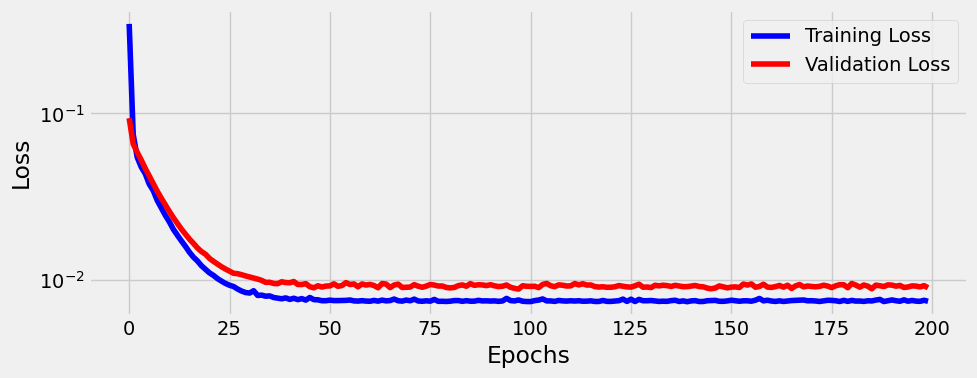

In [51]:
fig = plot_losses(losses, val_losses)
fig

# TensorBoard

### a. tensorboard - path

In [7]:
import os
os.environ['TENSORBOARD_BINARY'] = r'C:\Users\fuy3pk\AppData\Roaming\Python\Python311\Scripts\tensorboard.exe'

### b. numpy==1.23.5

In [52]:
# numpy version
print(np.__version__)

1.26.4


In [53]:
tensorboard_cleanup()

## SummaryWriter

In [54]:
writer = SummaryWriter('runs/test')

## add_graph

In [55]:
writer.add_graph(model)

example_kwarg_inputs should be a dict
Error occurs, No graph saved


RuntimeError: example_kwarg_inputs should be a dict

In [56]:
# Fetching a tuple of feature (sample_x) and label (sample_y)
sample_x, sample_y = next(iter(train_loader))

# Since our model was sent to device, we need to do the same with the data
# Even here, both model and data need to be on the same device!
writer.add_graph(model, sample_x.to(device))

## add_scalars

In [57]:
writer.add_scalars('loss', {'training': loss, 'validation': val_loss}, epoch)

### Model Configuration V3

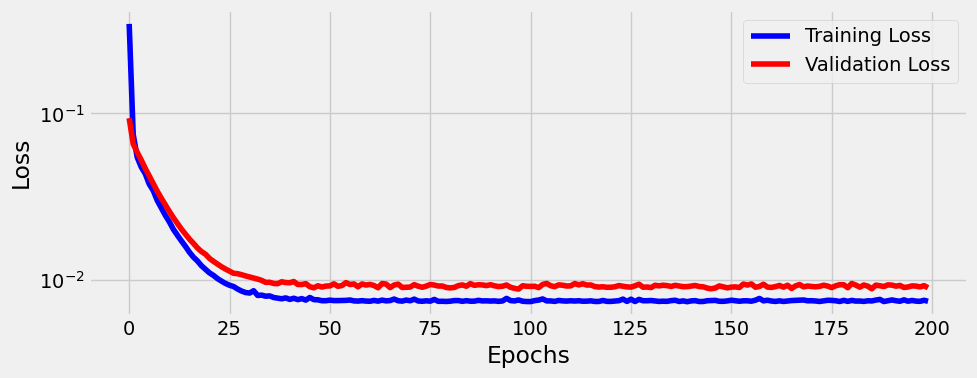

In [58]:
%run -i data_preparation/v2.py

In [59]:
%%writefile model_configuration/v3.py

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Sets learning rate - this is "eta" ~ the "n" like Greek letter
lr = 0.1

torch.manual_seed(42)
# Now we can create a model and send it at once to the device
model = nn.Sequential(nn.Linear(1, 1)).to(device)

# Defines a SGD optimizer to update the parameters (now retrieved directly from the model)
optimizer = optim.SGD(model.parameters(), lr=lr)

# Defines a MSE loss function
loss_fn = nn.MSELoss(reduction='mean')

# Creates the train_step function for our model, loss function and optimizer
train_step_fn = make_train_step_fn(model, loss_fn, optimizer)

# Creates the val_step function for our model and loss function
val_step_fn = make_val_step_fn(model, loss_fn)

# Creates a Summary Writer to interface with TensorBoard
writer = SummaryWriter('runs/simple_linear_regression')

# Fetches a single mini-batch so we can use add_graph
x_sample, y_sample = next(iter(train_loader))
writer.add_graph(model, x_sample.to(device))

Overwriting model_configuration/v3.py


In [60]:
%run -i model_configuration/v3.py

<Figure size 640x480 with 0 Axes>

### Model Training V5

In [61]:
%%writefile model_training/v5.py

# Defines number of epochs
n_epochs = 200

losses = []
val_losses = []

for epoch in range(n_epochs):
    # inner loop
    loss = mini_batch(device, train_loader, train_step_fn)
    losses.append(loss)
    
    # VALIDATION
    # no gradients in validation!
    with torch.no_grad():
        val_loss = mini_batch(device, val_loader, val_step_fn)
        val_losses.append(val_loss)
    
    # Records both losses for each epoch under the main tag "loss"
    writer.add_scalars(main_tag='loss',
                       tag_scalar_dict={'training': loss, 'validation': val_loss},
                       global_step=epoch)

# Closes the writer
writer.close()

Overwriting model_training/v5.py


In [62]:
%run -i model_training/v5.py

In [63]:
# Checks model's parameters
print(model.state_dict())

OrderedDict([('0.weight', tensor([[1.9432]], device='cuda:0')), ('0.bias', tensor([1.0263], device='cuda:0'))])


# Saving and Loading Models

## Saving

### Cell 2.4 - `torch.save()`

In [53]:
checkpoint = {'epoch': n_epochs,
              'model_state_dict': model.state_dict(),
              'optimizer_state_dict': optimizer.state_dict(),
              'loss': losses,
              'val_loss': val_losses}

torch.save(checkpoint, 'save/e02_model_checkpoint.pth')

## Resuming Training

### Cell 2.5

In [54]:
%run -i data_preparation/v2.py
%run -i model_configuration/v3.py

In [55]:
print(model.state_dict())

OrderedDict([('0.weight', tensor([[0.7645]], device='cuda:0')), ('0.bias', tensor([0.8300], device='cuda:0'))])


### Cell 2.6 - load model checkpoint
* `torch.load()`
* `model.load_state_dict()`
* `optimizer.load_state_dict()`
* `saved_epoch`
* `saved_losses`
* `saved_val_losses`
* `model.train()` --> always use Train for resuming training

In [69]:
checkpoint = torch.load('save/e02_model_checkpoint.pth')

model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

saved_epoch = checkpoint['epoch']
saved_losses = checkpoint['loss']
saved_val_losses = checkpoint['val_loss']

# always use TRAIN for resuming training
model.train() 

Sequential(
  (0): Linear(in_features=1, out_features=1, bias=True)
)

In [57]:
print(model.state_dict())

OrderedDict([('0.weight', tensor([[1.9432]], device='cuda:0')), ('0.bias', tensor([1.0263], device='cuda:0'))])


### Cell 2.7

In [58]:
%run -i model_training/v5.py

In [59]:
print(model.state_dict())

OrderedDict([('0.weight', tensor([[1.9432]], device='cuda:0')), ('0.bias', tensor([1.0263], device='cuda:0'))])


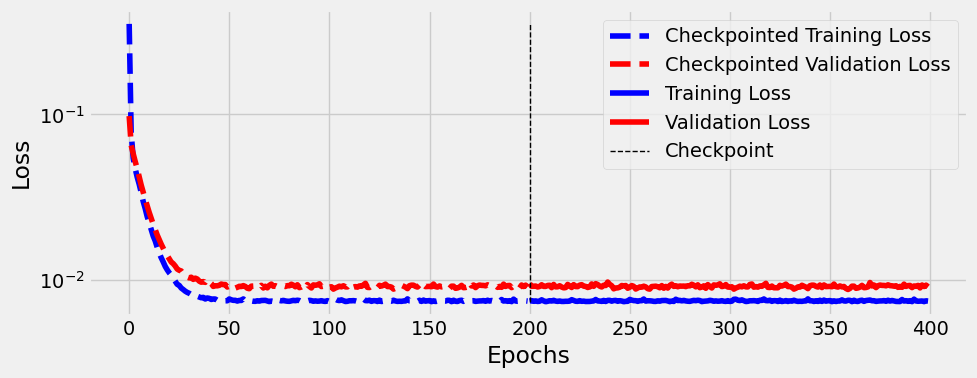

In [61]:
fig = plot_resumed_losses(saved_epoch, saved_losses, saved_val_losses, n_epochs, losses, val_losses)
fig

## Deploying / Making Predictions

### Cell 2.8

In [ ]:
%run -i model_configuration/v3.py

### Cell 2.9

In [63]:
checkpoint = torch.load('save/e02_model_checkpoint.pth')

model.load_state_dict(checkpoint['model_state_dict'])

print(model.state_dict())

OrderedDict([('0.weight', tensor([[1.9432]], device='cuda:0')), ('0.bias', tensor([1.0263], device='cuda:0'))])


### Cell 2.10 - `model.eval()`

In [69]:
new_inputs = torch.tensor([[.20], [.34], [.57]])

model.eval() # always use EVAL for fully trained models!
model(new_inputs.to(device))

tensor([[1.4185],
        [1.6908],
        [2.1381]], device='cuda:0', grad_fn=<AddmmBackward>)

# Putting It All Together

In [64]:
# %load data_preparation/v2.py

torch.manual_seed(13)

# Builds tensors from numpy arrays BEFORE split
x_tensor = torch.from_numpy(x).float()
y_tensor = torch.from_numpy(y).float()

# Builds dataset containing ALL data points
dataset = TensorDataset(x_tensor, y_tensor)

# Performs the split
ratio = .8
n_total = len(dataset)
n_train = int(n_total * ratio)
n_val = n_total - n_train

train_data, val_data = random_split(dataset, [n_train, n_val])

# Builds a loader of each set
train_loader = DataLoader(dataset=train_data, batch_size=16, shuffle=True)
val_loader = DataLoader(dataset=val_data, batch_size=16)

In [65]:
# %load model_configuration/v3.py

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Sets learning rate - this is "eta" ~ the "n" like Greek letter
lr = 0.1

torch.manual_seed(42)
# Now we can create a model and send it at once to the device
model = nn.Sequential(nn.Linear(1, 1)).to(device)

# Defines a SGD optimizer to update the parameters (now retrieved directly from the model)
optimizer = optim.SGD(model.parameters(), lr=lr)

# Defines a MSE loss function
loss_fn = nn.MSELoss(reduction='mean')

# Creates the train_step function for our model, loss function and optimizer
train_step_fn = make_train_step_fn(model, loss_fn, optimizer)

# Creates the val_step function for our model and loss function
val_step_fn = make_val_step_fn(model, loss_fn)

# Creates a Summary Writer to interface with TensorBoard
#writer = SummaryWriter('runs/simple_linear_regression')

# Fetches a single mini-batch so we can use add_graph
#x_sample, y_sample = next(iter(train_loader))
#writer.add_graph(model, x_sample.to(device))

### `torch.no_grad()` - validation

In [66]:
# %load model_training/v5.py

# Defines number of epochs
n_epochs = 200

losses = []
val_losses = []

for epoch in range(n_epochs):
    # inner loop
    loss = mini_batch(device, train_loader, train_step_fn)
    losses.append(loss)
    
    # VALIDATION
    # no gradients in validation!
    with torch.no_grad():
        val_loss = mini_batch(device, val_loader, val_step_fn)
        val_losses.append(val_loss)
    
    # Records both losses for each epoch under the main tag "loss"
    #writer.add_scalars(main_tag='loss',
                       #tag_scalar_dict={'training': loss, 'validation': val_loss},
                       #global_step=epoch)

# Closes the writer
#writer.close()

In [67]:
print(model.state_dict())

OrderedDict([('0.weight', tensor([[1.9438]], device='cuda:0')), ('0.bias', tensor([1.0287], device='cuda:0'))])


### Weird plots in TensorBoard?

Run this if you want to clean up a previous run and start fresh with TensorBoard :-)

In [68]:
import shutil

shutil.rmtree('./runs/simple_linear_regression/', ignore_errors=True)